In [1]:
import pandas as pd

# Load the dataset
file_path = '/Users/amna/Desktop/Hotel Reservations.csv'
hotel_data = pd.read_csv(file_path)

# Displaying the first few rows of the dataset to understand its structure and contents
hotel_data.head()

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled


In [9]:
hotel_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

In [5]:
# Checking for missing values in the dataset
missing_values = hotel_data.isnull().sum()

# Checking for anomalies or unusual data (like negative values in columns where it doesn't make sense)
anomaly_check = {
    'Negative Values': (hotel_data.select_dtypes(include=['int', 'float']) < 0).sum(),
    'Unique Values': hotel_data.nunique()
}

missing_values, anomaly_check

(Booking_ID                              0
 no_of_adults                            0
 no_of_children                          0
 no_of_weekend_nights                    0
 no_of_week_nights                       0
 type_of_meal_plan                       0
 required_car_parking_space              0
 room_type_reserved                      0
 lead_time                               0
 arrival_year                            0
 arrival_month                           0
 arrival_date                            0
 market_segment_type                     0
 repeated_guest                          0
 no_of_previous_cancellations            0
 no_of_previous_bookings_not_canceled    0
 avg_price_per_room                      0
 no_of_special_requests                  0
 booking_status                          0
 dtype: int64,
 {'Negative Values': no_of_adults                            0
  no_of_children                          0
  no_of_weekend_nights                    0
  no_of_week_nigh

In [7]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import numpy as np

# Identifying categorical and numerical columns
categorical_cols = hotel_data.select_dtypes(include=['object', 'bool']).columns.tolist()
numerical_cols = hotel_data.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Removing columns that should not be transformed
categorical_cols.remove('Booking_ID')
numerical_cols.remove('arrival_year')
numerical_cols.remove('arrival_month')
numerical_cols.remove('arrival_date')

# Creating a column transformer for preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ])

# Applying the transformations to the dataset
hotel_data_preprocessed = preprocessor.fit_transform(hotel_data)

# The transformed data is now in a NumPy array format. We need to convert it back to a DataFrame.
# First, get the column names from the one-hot encoder for the categorical columns
one_hot_columns = preprocessor.named_transformers_['cat'].get_feature_names_out(input_features=categorical_cols)
new_columns = numerical_cols + one_hot_columns.tolist()

# Create a new DataFrame with the transformed data
hotel_data_transformed = pd.DataFrame(hotel_data_preprocessed, columns=new_columns)

# Displaying the first few rows of the transformed dataset
hotel_data_transformed.head()


,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,...,room_type_reserved_Room_Type 5,room_type_reserved_Room_Type 6,room_type_reserved_Room_Type 7,market_segment_type_Aviation,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online,booking_status_Canceled,booking_status_Not_Canceled
0,0.298893,-0.26147,0.217401,-0.144803,-0.178819,1.614896,-0.16221,-0.063393,-0.087456,-1.095033,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,0.298893,-0.26147,1.365993,0.563972,-0.178819,-0.933701,-0.16221,-0.063393,-0.087456,0.092806,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,-1.628975,-0.26147,1.365993,-0.853578,-0.178819,-0.980250,-0.16221,-0.063393,-0.087456,-1.237528,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,0.298893,-0.26147,-0.931190,-0.144803,-0.178819,1.463610,-0.16221,-0.063393,-0.087456,-0.097567,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
4,0.298893,-0.26147,0.217401,-0.853578,-0.178819,-0.433291,-0.16221,-0.063393,-0.087456,-0.254312,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0


# Statistical Summary and Data Visualizations
Statistical Summary of Numerical Columns:
Number of Adults (no_of_adults): Ranges from 0 to 4, with an average of approximately 1.85 per booking.
Number of Children (no_of_children): Ranges from 0 to 10, but the average is close to 0.1, indicating most bookings do not include children.
Weekend Nights (no_of_weekend_nights): Most bookings include up to 2 weekend nights, with a maximum of 7.
Week Nights (no_of_week_nights): Ranges from 0 to 17 nights, with an average of about 2.2 nights per booking.
Car Parking Space (required_car_parking_space): Very few bookings require car parking space.
Lead Time (lead_time): Varies widely from 0 to 443 days, with an average lead time of about 85 days.
Repeated Guest (repeated_guest): A small fraction (around 2.56%) of the bookings are made by repeated guests.
Previous Cancellations (no_of_previous_cancellations): Most guests have not canceled previously.
Previous Bookings Not Canceled (no_of_previous_bookings_not_canceled): Similar to cancellations, most guests do not have a history of bookings that were not canceled.
Average Price per Room (avg_price_per_room): Prices vary significantly, ranging from 0 to 540, with an average of around 103.
Special Requests (no_of_special_requests): On average, less than one special request is made per booking.
Data Visualizations:
Monthly Booking Trends by Year:

The line plot shows the number of bookings per month for different years. This helps in understanding the seasonal trends in bookings. Peaks and troughs may indicate high and low seasons respectively.
Correlation Heatmap:

The heatmap illustrates the correlations between different numerical variables. Strong correlations (close to 1 or -1) may indicate a significant relationship between variables, while values close to 0 suggest a weak or no linear relationship.
This heatmap can help in understanding which factors are more closely related to others, which can be crucial for predictive modeling.

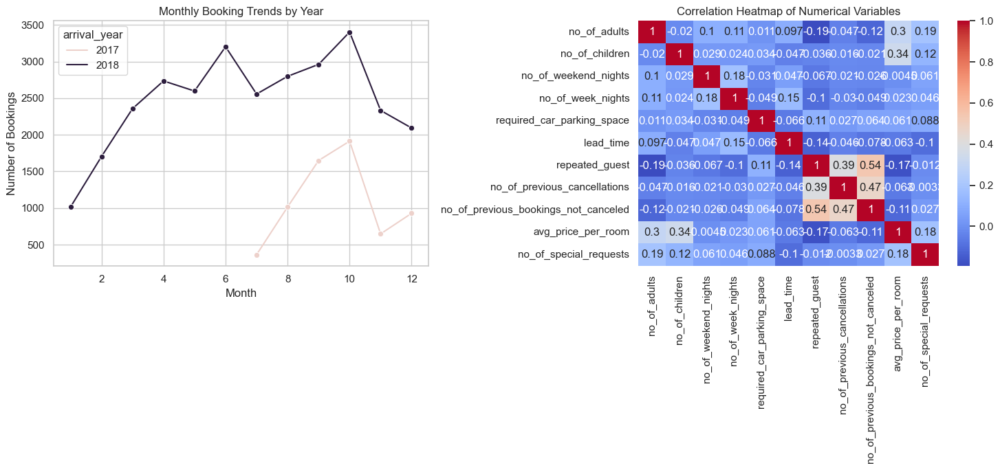

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests
count,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000
mean,1.844962,0.105279,0.810724,2.204300,0.030986,85.232557,0.025637,0.023349,0.153411,103.423539,0.619655
std,0.518715,0.402648,0.870644,1.410905,0.173281,85.930817,0.158053,0.368331,1.754171,35.089424,0.786236
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000,1.000000,0.000000,17.000000,0.000000,0.000000,0.000000,80.300000,0.000000
50%,2.000000,0.000000,1.000000,2.000000,0.000000,57.000000,0.000000,0.000000,0.000000,99.450000,0.000000
75%,2.000000,0.000000,2.000000,3.000000,0.000000,126.000000,0.000000,0.000000,0.000000,120.000000,1.000000
max,4.000000,10.000000,7.000000,17.000000,1.000000,443.000000,1.000000,13.000000,58.000000,540.000000,5.000000


In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Since the transformed data doesn't include the date columns and categorical columns in their original form, 
# we'll use the original dataset for some of these visualizations.

# Setting the aesthetics for the plots
sns.set(style="whitegrid")

# 1. Statistical summaries of numerical columns
numerical_summary = hotel_data[numerical_cols].describe()

# 2. Booking trends over time
# Grouping data by arrival year and month to see the trends
booking_trends = hotel_data.groupby(['arrival_year', 'arrival_month']).size().reset_index(name='count')

# 3. Relationship between different variables
# For this, we will create a heatmap of the correlation matrix
correlation_matrix = hotel_data[numerical_cols].corr()

# Plotting the results
plt.figure(figsize=(15, 7))

# Booking trends plot
plt.subplot(1, 2, 1)
sns.lineplot(x="arrival_month", y="count", hue="arrival_year", data=booking_trends, marker="o")
plt.title('Monthly Booking Trends by Year')
plt.xlabel('Month')
plt.ylabel('Number of Bookings')

# Correlation heatmap
plt.subplot(1, 2, 2)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap of Numerical Variables')

plt.tight_layout()
plt.show()

numerical_summary


The feature engineering process belwo has added several new features to the 'INN Hotels' dataset, providing additional dimensions for analysis:

Season: Based on the arrival month, the season of the booking is categorized as Spring, Summer, Autumn, or Winter. This feature can help in analyzing seasonal trends in bookings.

Weekend Stay: This binary feature indicates whether the booking includes any weekend nights, which could be relevant for understanding booking preferences for leisure vs. business trips.

Total Stay: The sum of weekend and weeknights, giving the total duration of stay. This could be useful for understanding the length of stay preferences among guests.

Family Size: The sum of the number of adults and children, representing the size of the group staying. This feature can provide insights into whether the hotel is more frequented by individuals, couples, families, etc.

Meal Room Interaction: A combined feature of meal plan type and room type reserved, which could uncover specific combinations that are more popular or prone to cancellations.

Lead Time Category: The lead time has been categorized into short, medium, and long. This segmentation can help in understanding how booking lead time influences cancellations or other behaviors.

,season,weekend_stay,total_stay,family_size,meal_room_interaction,lead_time_category
0,Autumn,1,3,2,Meal Plan 1_Room_Type 1,long
1,Autumn,1,5,2,Not Selected_Room_Type 1,short
2,Winter,1,3,1,Meal Plan 1_Room_Type 1,short
3,Spring,0,2,2,Meal Plan 1_Room_Type 1,long
4,Spring,1,2,2,Not Selected_Room_Type 1,medium


In [18]:
# Analyzing the new features using statistical summaries and data visualizations
hotel_data.describe()


,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,weekend_stay,total_stay,family_size
count,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000
mean,1.844962,0.105279,0.810724,2.204300,0.030986,85.232557,2017.820427,7.423653,15.596995,0.025637,0.023349,0.153411,103.423539,0.619655,0.534886,3.015024,1.950241
std,0.518715,0.402648,0.870644,1.410905,0.173281,85.930817,0.383836,3.069894,8.740447,0.158053,0.368331,1.754171,35.089424,0.786236,0.498788,1.786017,0.650327
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2017.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,0.000000,17.000000,2018.000000,5.000000,8.000000,0.000000,0.000000,0.000000,80.300000,0.000000,0.000000,2.000000,2.000000
50%,2.000000,0.000000,1.000000,2.000000,0.000000,57.000000,2018.000000,8.000000,16.000000,0.000000,0.000000,0.000000,99.450000,0.000000,1.000000,3.000000,2.000000
75%,2.000000,0.000000,2.000000,3.000000,0.000000,126.000000,2018.000000,10.000000,23.000000,0.000000,0.000000,0.000000,120.000000,1.000000,1.000000,4.000000,2.000000
max,4.000000,10.000000,7.000000,17.000000,1.000000,443.000000,2018.000000,12.000000,31.000000,1.000000,13.000000,58.000000,540.000000,5.000000,1.000000,24.000000,12.000000


In [24]:
import numpy as np

# Original dataset is used for feature engineering
df = hotel_data.copy()

# 1. Date Features Extraction
# Seasonality
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

df['season'] = df['arrival_month'].apply(get_season)

# Weekday vs. Weekend (assuming 5-6 as weekend)
df['is_weekend_arrival'] = df['arrival_date'].apply(lambda x: 1 if x in [5, 6] else 0)

# 2. Aggregated Features
# Total Stay Duration
df['total_stay'] = df['no_of_weekend_nights'] + df['no_of_week_nights']

# Family Size
df['family_size'] = df['no_of_adults'] + df['no_of_children']

# 3. Interaction Features (as dummy variables for simplicity)
df['meal_plan_room_type'] = df['type_of_meal_plan'] + '_' + df['room_type_reserved']

# 4. Categorical Feature Engineering
# Room Type Popularity (based on number of bookings)
room_type_counts = df['room_type_reserved'].value_counts()
df['room_type_popularity'] = df['room_type_reserved'].apply(lambda x: room_type_counts[x])

# Market Segment Analysis (as dummy variables for simplicity)
df['market_segment'] = df['market_segment_type']

# 6. Booking Lead Time Categories
df['lead_time_category'] = pd.cut(df['lead_time'], bins=[-np.inf, 30, 90, 180, np.inf], labels=['Short', 'Medium', 'Long', 'Very Long'])

# 7. Price Sensitivity Features (High price if above average)
average_price = df['avg_price_per_room'].mean()
df['high_price_booking'] = df['avg_price_per_room'].apply(lambda x: 1 if x > average_price else 0)

# Previewing the new features added to the dataset
new_features = df[['season', 'is_weekend_arrival', 'total_stay', 'family_size', 'meal_plan_room_type', 
                   'room_type_popularity', 'market_segment', 'lead_time_category', 'high_price_booking']]
new_features.head()

,season,is_weekend_arrival,total_stay,family_size,meal_plan_room_type,room_type_popularity,market_segment,lead_time_category,high_price_booking
0,Autumn,0,3,2,Meal Plan 1_Room_Type 1,28130,Offline,Very Long,0
1,Autumn,1,5,2,Not Selected_Room_Type 1,28130,Online,Short,1
2,Winter,0,3,1,Meal Plan 1_Room_Type 1,28130,Online,Short,0
3,Spring,0,2,2,Meal Plan 1_Room_Type 1,28130,Online,Very Long,0
4,Spring,0,2,2,Not Selected_Room_Type 1,28130,Online,Medium,0


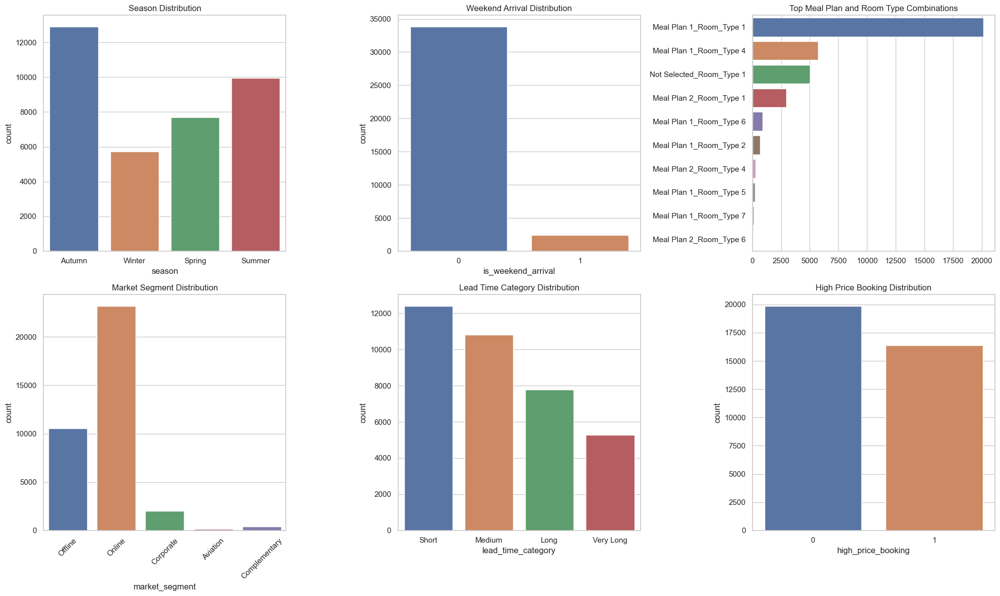

,is_weekend_arrival,high_price_booking
count,36275.000000,36275.000000
mean,0.066906,0.452074
std,0.249862,0.497705
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,1.000000
max,1.000000,1.000000


In [25]:
# Analyzing the new features using statistical summaries and data visualizations

# 1. Statistical Summary for the new categorical features
categorical_summary = df[['season', 'is_weekend_arrival', 'meal_plan_room_type', 
                          'market_segment', 'lead_time_category', 'high_price_booking']].describe()

# Visualizations
plt.figure(figsize=(20, 12))

# Season distribution
plt.subplot(2, 3, 1)
sns.countplot(data=df, x='season')
plt.title('Season Distribution')

# Is Weekend Arrival distribution
plt.subplot(2, 3, 2)
sns.countplot(data=df, x='is_weekend_arrival')
plt.title('Weekend Arrival Distribution')

# Meal Plan and Room Type Interaction
plt.subplot(2, 3, 3)
df_meal_room = df['meal_plan_room_type'].value_counts().head(10) # Top 10 combinations
sns.barplot(x=df_meal_room.values, y=df_meal_room.index)
plt.title('Top Meal Plan and Room Type Combinations')

# Market Segment distribution
plt.subplot(2, 3, 4)
sns.countplot(data=df, x='market_segment')
plt.xticks(rotation=45)
plt.title('Market Segment Distribution')

# Lead Time Category distribution
plt.subplot(2, 3, 5)
sns.countplot(data=df, x='lead_time_category')
plt.title('Lead Time Category Distribution')

# High Price Booking distribution
plt.subplot(2, 3, 6)
sns.countplot(data=df, x='high_price_booking')
plt.title('High Price Booking Distribution')

plt.tight_layout()
plt.show()

categorical_summary

In [28]:
# Import the ProfileReport class from the ydata_profiling library
!pip install ydata-profiling
from ydata_profiling import ProfileReport

# Create a comprehensive profile report for the DataFrame 'df'
# This report will contain various statistics, insights, and visualizations about the data
profile = ProfileReport(df, title='Data Profile Report')

profile.to_notebook_iframe() # use this line to show the output

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Re-loading the dataset
file_path = '/Users/amna/Desktop/Hotel Reservations.csv'
hotel_data = pd.read_csv(file_path)

# Simplified Feature Engineering
# Convert categorical variables using Label Encoding
label_encoders = {}
for column in hotel_data.select_dtypes(include=['object']).columns:
    if column != 'booking_status':  # Exclude the target variable
        label_encoders[column] = LabelEncoder()
        hotel_data[column] = label_encoders[column].fit_transform(hotel_data[column])

# Splitting the dataset into features and target variable
X = hotel_data.drop('booking_status', axis=1)
y = hotel_data['booking_status'].apply(lambda x: 1 if x == 'Canceled' else 0)  # Binary encoding of target

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Creating and training the Decision Tree model
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(X_train, y_train)

# Making predictions on the test set
y_pred = decision_tree.predict(X_test)

# Evaluating the model
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

conf_matrix, class_report


(array([[6393,  883],
        [ 781, 2826]]),
 '              precision    recall  f1-score   support\n\n           0       0.89      0.88      0.88      7276\n           1       0.76      0.78      0.77      3607\n\n    accuracy                           0.85     10883\n   macro avg       0.83      0.83      0.83     10883\nweighted avg       0.85      0.85      0.85     10883\n')

In [7]:
from sklearn.ensemble import RandomForestClassifier

# Creating and training the Random Forest model
random_forest = RandomForestClassifier(random_state=42)
random_forest.fit(X_train, y_train)

# Making predictions on the test set
y_pred_rf = random_forest.predict(X_test)

# Evaluating the model
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
class_report_rf = classification_report(y_test, y_pred_rf)

conf_matrix_rf, class_report_rf

(array([[6904,  372],
        [ 728, 2879]]),
 '              precision    recall  f1-score   support\n\n           0       0.90      0.95      0.93      7276\n           1       0.89      0.80      0.84      3607\n\n    accuracy                           0.90     10883\n   macro avg       0.90      0.87      0.88     10883\nweighted avg       0.90      0.90      0.90     10883\n')